In [10]:
from data_fetcher import DataFetcher
from trading import Strategies 
import pandas as pd 
import numpy as np 
from binance.client import Client
import matplotlib.pyplot as plt

import gym
from gym import spaces

# Class for Strategies

#### Following, the class created for create the strategies


First two cells below are to visualize how the strategy can be written

In [1]:
#################################### Class for fetching data 


import pandas as pd
import numpy as np
from binance.client import Client
from utils import get_interval_from_string #for the mapping of the interval




class DataFetcher:
    """
    A class to fetch historical candlestick data from the Binance API.
    
    The DataFetcher class allows you to retrieve market data from a specified client and 
    for a specified symbol.

    Attributes:
        client (Client): The Binance API client used for making requests.
        symbol (str): The market symbol to fetch data for (e.g., "BTCUSDT").


    Methods:
        __init__(client, symbol):
            Initializes the DataFetcher with the specified parameters.
        
        get_interval_from_string(interval_str):
            Converts a user-friendly interval string (e.g., "1DAY") into the corresponding Binance constant.
        
        fetch_data(interval, start_date, end_date):
            Fetches the historical candlestick data and returns it as a pandas DataFrame.

        Other functions will be documented in the memo 
    """


    # Now I can initiate the class
    def __init__(self, client, symbol):
        """
        Initializes the DataFetcher instance with the provided parameters.

        Parameters:
            client (Client): The Binance API client instance used for fetching data.
            symbol (str): The symbol for which to fetch the historical data (e.g., "BTCUSDT").
        
        """
        self.client = client
        self.symbol = symbol




    def fetch_data(self, interval, start_date, end_date):
        """
        Fetches the historical candlestick data for the specified symbol, interval, and date range.
        
        This method calls the Binance API and converts the raw data into a pandas DataFrame.
        
        Parameters: 
            interval (str): this is a string identifying the time interval you want to dowload the data (e.g 1DAY)
            start_date (str): Starting date from which you want to download the data, in Binance format (e.g. "1 Jan, 2025")
            end_date (str): Ending date until which you want to download the data, in Binance format (e.g. "3 Jan, 2025")
        
        Returns:
            pd.DataFrame: A pandas DataFrame containing the candlestick data with columns
                          ['timestamp', 'open', 'high', 'low', 'close', 'volume'].
        """
        # Fetch historical klines
        candles = self.client.get_historical_klines(self.symbol, get_interval_from_string(interval), 
                                                    start_date, end_date)
        
        # Convert to DataFrame
        columns = ['timestamp', 'open', 'high', 'low', 'close', 'volume', 'close_time', 
                   'quote_asset_volume', 'number_of_trades', 'taker_buy_base', 'taker_buy_quote', 'ignore']
        df = pd.DataFrame(candles, columns= columns)
        
        # Process DataFrame
        df['timestamp'] = pd.to_datetime(df['timestamp'], unit='ms')
        df.set_index('timestamp', inplace=True)
        df = df[['open', 'high', 'low', 'close', 'volume']].astype(float)
        return df
    # End of fetch_data() ----------------------------------------------------------------------------------------------------------


    def fetch_VWAP(self, interval, start_date, end_date):
        """
        Fetches the historical candlestick data and calculates the Volume Weighted Average Price (VWAP).
        
        This function retrieves the market data using the `fetch_data` method of the `DataFetcher` class, 
        then calculates the VWAP using the formula: VWAP = (Price * Volume) / Volume, where Price is the typical price 
        (average of high, low, and close).

        Parameters:
            interval (str): The time interval for the candlestick data (e.g., "1DAY", "1HOUR").
            start_date (str): The starting date for the data retrieval (e.g., "1 Jan, 2025").
            end_date (str): The ending date for the data retrieval (e.g., "3 Jan, 2025").

        Returns:
            pd.DataFrame: A pandas DataFrame containing the historical candlestick data along with a new column 'VWAP', 
                        representing the Volume Weighted Average Price.
            """
        df = DataFetcher.fetch_data(self, interval, start_date, end_date)
        
        # Calculate VWAP ( (Price * Volume) / Volume )
        df['VWAP'] = np.cumsum(df['volume'] * ((df['high'] + df['low'] + df['close']) / 3)) / np.cumsum(df['volume'])
        
        return df
    # End of fetch_VWAP() ----------------------------------------------------------------------------------------------------------



    def VWAP(self, df):
        """
        This function is created to add a column to the dataframe to compute teh VWAP, the data frame should be created with 
        the class DataFetcher for consistency reasons (df = DataFetcher.fetch_data(self, interval, start_date, end_date))
        The newly added column is called "VWAP". The VWAP is computed as 
        VWAP = cumsum(Volume * (H + L + C)/3 ) / cumsum(Volume).
        
        This VWAP is implemented on a session basis (every session starts at midnight). 
        The function uses (where possible) vectors and numpy to be more efficient  
        """
        # Ensure the index is in datetime format
        #df = pd.DataFrame(df)
        df.index = pd.to_datetime(df.index, unit='ms')

        # Extract session date from index to reset VWAP daily
        df["session_date"] = df.index.date

        # Calculate Typical Price (TP)
        df['TP'] = (df['high'] + df['low'] + df['close']).values / 3  

        # Calculate session-based VWAP
        df['VWAP'] = df.groupby('session_date', group_keys=False).apply(
            lambda g: np.cumsum(g['volume'] * g['TP']) / np.cumsum(g['volume'])
        )

        # Drop columns created for the VWAP creation 
        df = df.drop(columns= ["TP","session_date"])

        #Return
        return df

    # End of VWAP() ----------------------------------------------------------------------------------------------------------------


    def RSI(self, df, period=14, column = "close"):
        """
        Calculate the Relative Strength Index (RSI) for a given dataset.
        
        Parameters:
        - df (pd.Series): Series of closing prices
        - period (int): Lookback period for RSI (default=14)
        - columns (str): Column from which to compute the RSI. It should not be changed (default = "close")
        
        Returns:
        - pd.Series: RSI values
        """
        #df = pd.DataFrame(df)
        # Ensure the 'close' column exists in the dataset
        if column not in df.columns:
            raise ValueError(f"The dataset must contain a {column} column.")
        
        # Initialise the function
        delta = df[column].diff(1)

        gain = np.where(delta > 0 , delta, 0)
        loss = np.where(delta < 0 , -delta, 0)

        # As a series 
        gain = pd.Series(gain, index = df.index)
        loss = pd.Series(loss, index = df.index)

        # Create averages
        avg_gain = gain.rolling(window=period, min_periods=1).mean()
        avg_loss = loss.rolling(window=period, min_periods=1).mean()

        # Compute the Relative Strenght
        RS = avg_gain / avg_loss

        # Compute the Index (RSI)
        RSI = 100 - ( 100/(1+RS) )

        # Remove the first na value 
        if np.isnan(RSI[0]):
            RSI[0] = 0

        # Assing the RSI 
        df["RSI"] = RSI 

        # Return
        return df
    # End of RSI()--------------------------------------------------------------------------------------------------------------------------



    def SMA(self, df, period=14, column = "close"):
        """
    Calculate the Simple Moving Average (SMA) for a given DataFrame.

    Parameters:
    - df (pd.DataFrame): DataFrame containing stock data.
    - column (str): Column name for closing prices (default="close").
    - period (int): Lookback period for SMA (default=14).

    Returns:
    - pd.Series: SMA values added as a new column in the DataFrame.
        """
        #df = pd.DataFrame(df)
        # Ensure the 'close' column exists in the dataset
        if column not in df.columns:
            raise ValueError(f"The dataset must contain a {column} column.")
        
        # Calcualte it 
        df["SMA"] = df[column].rolling(window = period, min_periods=1).mean()

        return df
    # End of SMA()--------------------------------------------------------------------------------------------------------------------------




    def ATR(self, df, period = 14):
        """
        This function to add a column to a dataframe, The column contains the Average True Range (ATR), computed as 
        TR = max(H - L ; |H-C_prev| ; |L - C_prev|)
        ATR = 1/n * cumsum_1_to_n(TR_i)

        This is then smoothed with the Wilder's smoothing method
        ATR_i = ( (ATR_t-1 x (n-1))+ TR_i )/ n 
        This method allow to give to past observations less weight

        Teh computations are vectorized with numpys for optimized efficiency.

        Paramteres:
        df (pd.DataFrame): Dataframe created with the DataFetcher class (df = DataFetcher.fetch_data(self, interval, start_date, end_date))
        period (int): smoothing period over which compute the cumsum()
        """
        high_low = df["high"].values - df["low"].values
        high_close = np.abs(df["high"].values - df["close"].shift(1).fillna(df["close"].iloc[0]).values)
        low_close = np.abs(df['low'].values - df['low'].shift(1).fillna(df['close'].iloc[0]).values)

        # Define the true range
        true_range = np.maximum(high_low, high_close, low_close)

        # Wilder's smoothing method
        atr = np.empty_like(true_range) # Creates random values (faster than a vector with 0s)
        atr[:period] = np.mean(true_range[:period]) # This is the ATR until time i
        for i in range(period, len(atr)):  # For the rest, I use the Wilder's smoothing approach
            atr[i] = ( atr[i-1] * (period - 1) + true_range[i] ) / period

        # Return
        df["ATR"] = atr # Add a column to the dataframe
        return df
    #End of ATR() ----------------------------------------------------------------------------------------------------------------



    def fetch_VWAP_session(self, interval, start_date, end_date, time_session = "TV"):
        """
        Fetches the historical candlestick data and calculates the Volume Weighted Average Price (VWAP).
        This function calculate the VWAP for every session. It means that every day the calculation starts again. This is 
        more informative for trading, but it is slower and not applicable to time frames > 1 DAY 
        
        This function retrieves the market data using the `fetch_data` method of the `DataFetcher` class, 
        then calculates the VWAP using the formula: VWAP = (Price * Volume) / Volume, where Price is the typical price 
        (average of high, low, and close).

        Parameters:
            interval (str): The time interval for the candlestick data (e.g., "1DAY", "1HOUR").
            start_date (str): The starting date for the data retrieval (e.g., "1 Jan, 2025").
            end_date (str): The ending date for the data retrieval (e.g., "3 Jan, 2025").
            time_session (str): The desired time at what the session should start. The possible inputs are "TV" (tradin view)
            in which the VWAP indicator starts at 19, and "Midnight", in which the VWAP indicator start at 00:00. Baisc value is set to
            "TV".

        Returns:
            pd.DataFrame: A pandas DataFrame containing the historical candlestick data along with a new column 'VWAP', 
                        representing the Volume Weighted Average Price.
        """
        
        df = DataFetcher.fetch_data(self, interval, start_date, end_date)

        # Ensure the index is in datetime format
        df.index = pd.to_datetime(df.index, unit='ms')

        # Extract session date from index to reset VWAP daily
        if time_session == "TV":
            df['session_date'] = (df.index - pd.Timedelta(hours=19)).date 
        if time_session == "Midnight": 
            df["session_date"] = df.index.date

        # Calculate Typical Price (TP)
        df['TP'] = (df['high'] + df['low'] + df['close']) / 3  

        # Calculate session-based VWAP
        df['VWAP'] = df.groupby('session_date', group_keys=False).apply(
            lambda g: (g['volume'] * g['TP']).cumsum() / g['volume'].cumsum()
        )

        # Keep only relevant columns (index remains as timestamp)
        df = df[['open', 'high', 'low', 'close', 'volume', 'VWAP']]

        return df
    # End of fetch_VWAP_session() ----------------------------------------------------------------------------------------------------------



            
    


In [2]:
# Define the Data Fetcher

## 
API_key = "D2e3mW7aVMG1PnhhuVHayY9YqvVcr7JrKgBj3vrUQvNk6Fzb09Sb73eJ6YK53o3k"
API_secret = "I4ou2Q5R3H8Ypydlm3MTjjOe5zhCZK0pcGHl6hZn0eDpGsbyLkpclwXHEqoztkzL" 
client = Client(API_key, API_secret)
BTC_str = "BTCUSDT"
DataFetcher_BTC = DataFetcher(client, BTC_str)

# Last variables to be set up 
starting_date = "01 Nov, 2024"
ending_date = "02 Jan, 2025"
time_f = "1MIN"

# fetch the data
#df_VWAP = DataFetcher_BTC.fetch_VWAP_session(start_date= starting_date, end_date= ending_date,interval= time_f)
df_norm = DataFetcher_BTC.fetch_data(start_date= starting_date, end_date= ending_date,interval= time_f)

In [3]:
df = df_norm

df = DataFetcher_BTC.VWAP(df)
df = DataFetcher_BTC.ATR(df)
df = DataFetcher_BTC.RSI(df)
df = DataFetcher_BTC.SMA(df)
# inputs for the next function
#target_RR = 1
"""
This is to be used if the test set that we want to ulitze is based on a cutoff date and not on a random sample: 
starting_date1 = "03 Jan, 2025"
ending_date1 = "01 Mar, 2025"
df_test = DataFetcher_BTC.fetch_data(start_date = starting_date1, end_date = ending_date1, interval= time_f)

df_test = DataFetcher_BTC.VWAP(df_test)
df_test = DataFetcher_BTC.ATR(df_test)
df_test = DataFetcher_BTC.RSI(df_test)
df_test = DataFetcher_BTC.SMA(df_test)
"""

C:\Users\XM257FP\AppData\Local\Temp\ipykernel_42476\3363453065.py:134: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

C:\Users\XM257FP\AppData\Local\Temp\ipykernel_42476\3363453065.py:185: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\XM257FP\AppData\Local\Temp\ipykernel_42476\3363453065.py:186: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, us

'\nThis is to be used if the test set that we want to ulitze is based on a cutoff date and not on a random sample: \nstarting_date1 = "03 Jan, 2025"\nending_date1 = "01 Mar, 2025"\ndf_test = DataFetcher_BTC.fetch_data(start_date = starting_date1, end_date = ending_date1, interval= time_f)\n\ndf_test = DataFetcher_BTC.VWAP(df_test)\ndf_test = DataFetcher_BTC.ATR(df_test)\ndf_test = DataFetcher_BTC.RSI(df_test)\ndf_test = DataFetcher_BTC.SMA(df_test)\n'

# From here, we try the tradin env

In [4]:
 # (TradinEnv) The previous trading environment

import gym # This is the Open AI gym library utilized for Reinforcement Learning environment
from gym import spaces
from stable_baselines3 import PPO # Library to train AI models in reinforcement learning  

class TradinEnv(gym.Env):
    """
    Custom Trading Environment for Reinforcement Learning.
    

    The agent can take actions (buy, sell, hold) based on market indicators.
    The goal is to maximize profit while using stop-loss and take-profit levels.
    """
    def __init__(self,df):
        """
        Initialize the trading environment.

        Parameters:
        df (pd.DataFrame): Historical market data with indicators.
        execution_delay = 1
        """
        super(TradinEnv, self).__init__()

        # Store the dataset and set initial step 
        self.df = df
        self.current_step = 0 

        # Define action space: 3 possible actions (0 = Hold, 1 = Buy, 2 = Sell)
        self.action_space = spaces.Discrete(3)

        # Define the observation space: all column of the dataset that I have 
        self.observation_space = spaces.Box(  
            low = np.inf, high=np.inf, shape=( len(df.columns), ), dtype = np.float32 # Meaning it can take any number from all the columns of the df
        )

        # Initialize some trading varaibles (Note: still part of the class, just initializing them)
        self.balance = 1000 # Initial capital
        self.position = None # No active trade 
        self.entry_price = 0 # Price at which a trade was openend 


    def reset(self): 
        """
        Reset the environment at the start of a new episode. This function resets everything 
        when starts a new round 

        Returns:
        np.array: First observation (market indicators at step 0)
        """
        self.current_step = 0        
        self.balance = 1000
        self.position = None
        self.entry_price = 0
        return self._next_observation()

    def _next_observation(self):
        """
        Retrieve the current market state.

        Returns:
        np.array: Market indicators at the current step.
        """
        return self.df.iloc[self.current_step].values
    
    def step(self, action):
        """
        Execute an action (buy, sell, hold) and update the environment.

        Parameters:
        action (int): 0 (Hold), 1 (Buy), 2 (Sell)

        Returns:
        tuple: (new observation, reward, done flag, info)
        """
        current_price = self.df.iloc[self.current_step]["close"]
        entry_long = self.df.iloc[self.current_step].shift(1)["high"]
        entry_short = self.df.iloc[self.current_step].shift(1)["low"]
        atr_percent = self.df.iloc[self.current_step]["ATR"] / self.df.iloc[self.current_step]["close"] # It is used for stop loss and take profit
        previous_low = self.df["low"].shift(1)[self.current_step] # For the stop loss (long) and take profit (short)
        previous_high = self.df["high"].shift(1)[self.current_step] # For the stop loss (short) adn the take profit (long)

        reward = 0 # Default reward
        done = False # Track if episode is finished 

        # Execute action 
        if action == 1: # Buy (long)
            if self.position is None: # If the trade is closed 
                self.position = "long" # Change the position to long 
                self.entry_price = entry_long # Which is the previous high 
                self.stop_loss = previous_low - (atr_percent * self.entry_price)   
                self.take_profit = self.entry_price + (atr_percent * self.entry_price) 
        
        elif action == 2: # Sell (short)
            if self.position is None: # If the trade is closed 
                self.position = "short"
                self.entry_price = entry_short # This is the previous low.  
                self.stop_loss = previous_high + (atr_percent * self.entry_price) # Current price will be the entry price
                self.take_profit = self.entry_price - (atr_percent * self.entry_price)  

        
        # Cheeck if we are in a long or short setting 
        if self.position == "long": 
            if current_price >= self.take_profit: # Current price to be changed with whatever above TP
                reward = 1 # Define the reward for the supervised learning 
                self.position = None # Close the position
                self.balance = self.balance + (self.take_profit - self.entry_price) 
            elif current_price <= self.stop_loss:
                reward = -1 # Penalty for the loss
                self.position = None
                self.balance = self.balance + (self.stop_loss - self.entry_price) 

        elif self.position == "short":
            if current_price <= self.take_profit: # same comment as line 265 (tbd) 
                reward = 1 
                self.position = None
                self.balance = self.balance + (self.entry_price - self.take_profit)
            elif current_price >= self.stop_loss:
                reward = -1 
                self.position = None
                self.balance = self.balance + (self.entry_price - self.stop_loss )

        # Now we move to the next step 
        self.current_step += 1 # current step = current step + 1 
        if self.current_step >= len(self.df) - 1: # Condition to stop the loop
            done = True  

        return self._next_observation(), reward, done, {}
    
        
    def render(self):
        """
        Print the current state of the environment (for debugging).
        """
        print(f"Step: {self.current_step}, Balance: {self.balance}, Position: {self.position}")





In [5]:
import pandas as pd
import numpy as np
import gym
from gym import spaces
from stable_baselines3 import PPO # Library to train AI models in reinforcement learning  
import matplotlib.pyplot as plt

class TradinEnv_v1(gym.Env):
    """
    Custom Trading Environment for Reinforcement Learning.

    The agent can take actions (buy, sell, hold) based on market indicators.
    The goal is to maximize profit while using stop-loss and take-profit levels.
    """
    def __init__(self, df):
        """
        Initialize the trading environment.

        Parameters:
        df (pd.DataFrame): Historical market data with indicators.
        """
        super(TradinEnv_v1, self).__init__()

        # Store the dataset and set initial step 
        self.df = df
        self.current_step = 1
        self.balance = 1000 # Initial capital
        self.position = None # No active trade   
        self.pending_orders = []  # Store multiple pending orders
        self.execution_delay = 1 # To avoid the agent opening biased trade that look at the past 
        self.RR = 2

        # Define action space: 3 possible actions (0 = Hold, 1 = Buy, 2 = Sell) and 5 possible RR (0 to 5)
        self.action_space = spaces.Discrete(3)

        # Define the observation space: all columns of the dataset
        self.observation_space = spaces.Box(
            low=-np.inf, high=np.inf, shape=(len(df.columns),), dtype=np.float32
        ) # Should be changed to incorporate the RR ?  

    def reset(self): 
        """
        Reset the environment at the start of a new episode.

        Returns:
        np.array: First observation (market indicators at step 0)
        """
        self.current_step = 1
        self.balance = 1000
        self.position = None
        self.pending_orders = []
        return self._next_observation()

    def _next_observation(self):
        """
        Retrieve the current market state.

        Returns:
        np.array: Market indicators at the current step.
        """
        return self.df.iloc[self.current_step].values

    def step(self, action):
        """
        Execute an action (buy, sell, hold) and update the environment.

        Parameters:
        action (int): 0 (Hold), 1 (Buy), 2 (Sell)

        Returns:
        tuple: (new observation, reward, done flag, info)
        """
        current_price = self.df.iloc[self.current_step]['close'] #TBR
        high = self.df.iloc[self.current_step]['high']
        low = self.df.iloc[self.current_step]['low']
        atr_percent = self.df.iloc[self.current_step]["ATR"] / self.df.iloc[self.current_step]["close"]
        previous_high = self.df["high"].shift(1)[self.current_step]
        previous_low = self.df["low"].shift(1)[self.current_step]

        done = False

        # Handle new actions
        if action == 1:  # Buy limit order
            self.position = "long"
            print(f"Step check: Position (t): {self.position}, Action: {action}, Current step: {self.current_step}")#TBR
            stop_price = previous_low   
            self._place_order("buy", previous_high, stop_price, atr_percent)

        elif action == 2:  # Sell limit order
            self.position = "short" 
            print(f"Step check: Position (t): {self.position}, Action: {action}, Current step: {self.current_step}")#TBR
            stop_price = previous_high
            self._place_order("sell", previous_low, stop_price, atr_percent)


        # Process existing pending orders
        reward = self._execute_pending_orders(high, low) #TBR probably the "reward =" should be deleted 

        # Move to the next step
        self.current_step += 1
        if self.current_step >= len(self.df) - 1:
            done = True
        
        return self._next_observation(), reward, done, {}

    def _place_order(self, order_type, entry_price, stop_price, atr):
        """
        Place a limit order. By using a function, I am able to identify every order which is placed (and therefore executed)
        through the step at which is placed or executed 

        Parameters:
        order_type (str): 'buy' or 'sell'.
        entry_price (float): Price at which the order will be executed.
        """
        # Define the variable 
        self.pending_order = None

        # Define a converter to invert the sign of buy and sell 
        if order_type == "buy":
            buy_sell_converter = 1
        elif order_type == "sell":
            buy_sell_converter = -1 

        order = {
            "type": order_type,
            "entry_price": entry_price, 
            "step_placed": self.current_step,
            "take_profit": entry_price + ( ( abs(stop_price - entry_price) * self.RR ) * buy_sell_converter ), 
            "stop_loss" :  stop_price - ( (stop_price * atr) * buy_sell_converter )
        }
        self.pending_orders.append(order)

    def _execute_pending_orders(self, high, low):
        """
        Execute any pending limit orders if the price condition is met.

        Parameters:
        current_price (float): Current market price.
        high (float): Current high price.
        low (float): Current low price.
        """
        executed_orders = []
        reward = 0 

        for order in self.pending_orders:
            # Buy orders loop  
            if order["type"] == "buy":
                # Execute pending order (profit)
                if high >= order["take_profit"] and abs(order["step_placed"] - self.current_step) >= self.execution_delay: 
                    executed_orders.append(order)
                    self.balance +=  (self.balance*( (order["take_profit"] - order["entry_price"])/order["take_profit"] ) ) # this is wrong
                    reward += (order["take_profit"] - order["entry_price"])/order["take_profit"] 
                    print(f"Executed order : {executed_orders} \n")#TBR   
                # Stop loss trigger (loss)
                elif low <= order["stop_loss"] and abs(order["step_placed"] - self.current_step) >= self.execution_delay:
                    executed_orders.append(order)
                    self.balance += (self.balance*( (order["stop_loss"] - order["entry_price"])/order["stop_loss"] ) ) # this is wrong
                    reward += (order["stop_loss"] - order["entry_price"])/order["stop_loss"] 
                    print(f"Executed order : {executed_orders} \n")#TBR

            # Sell order
            elif order["type"] == "sell":
                # Execute pending order (profit)
                if low <= order["take_profit"] and abs(order["step_placed"] - self.current_step) >= self.execution_delay: 
                    executed_orders.append(order)
                    self.balance +=  ( self.balance* ( (order["entry_price"] - order["take_profit"])/order["entry_price"] ) )
                    reward +=  (order["entry_price"] - order["take_profit"])/order["entry_price"]
                    print(f"Executed order : {executed_orders} \n")#TBR   
                # Stop loss trigger (loss)
                elif high >= order["stop_loss"] and abs(order["step_placed"] - self.current_step) >= self.execution_delay:
                    executed_orders.append(order)
                    self.balance += (self.balance*( (order["entry_price"] - order["stop_loss"])/order["entry_price"] ) )
                    reward += (order["entry_price"] - order["stop_loss"])/order["entry_price"]
                    print(f"Executed order : {executed_orders} \n")#TBR
                    
        # Remove executed orders from the list
        self.pending_orders = [o for o in self.pending_orders if o not in executed_orders]
        return reward

    def render(self):
        """
        Print the current state of the environment (for debugging).
        """
        print(f"Step: {self.current_step}, Position (t-1): {self.position}, Balance: {self.balance}, Pending Orders: {self.pending_orders}")


# From here there is the perofmrance evaluation of the 


In [6]:
# Creating a new class for performance evaluation 


class PerformanceEvaluation:
    """
    This class is to evaluate the performance of the RL agent. It contains three main metrics (collected in three functions) which are 
    """
    def __init__(self, env, model, num_episodes = 100):
        # Setting the intial variables
        self.env = env 
        self.model = model 
        self.num_episodes = num_episodes
        self.reward_history = []
        self.balance_history = []

    def run_model(self, env, model): 
        """
        This function is to run the model and visualize the output after the environment has been created and 
        the model has been trained. 
        It should be intended as a function to be run when one don't want to assess the performance
        """
        
        obs = env.reset() # reset function put the state back to the initial state and return the first step of the dataset
        done = False 

        while not done:  # Keep running until done is True 
            action, _ = model.predict(obs) # Prediction using the trained model. Action is buy (1) or sell (2)
            obs, reward, done, _ = env.step(action) # Apply the action in the environment 
            env.render() # Print the state for debugging 
## End of run_model --------------------------------------------------------------------------------------------------------------


    def run_evaluation(self, first_run = True, show_plot = False, show_numerics = True):
        """
        This function run the evaluation of the performacne metrics, that include three main measures are: 
        Sample Efficiency: The time that the agent use to ahve a postiive reward. In the numeric format, is just the average of the 
        retun, showing therefore if the reward is postiive or negatvie. 

        Convergence Stability: This is the standard deviation of the reward. In the continuous format (i.e. in the plot) this measure is more indivative of the 
        improvement of the reward in time. The numeric outcome is jsut the average standard deviation

        Cumualtive P&L, this shows the cumulative P&L at the end of the trading process. 
        
        Parameters: 
        show_plot (bool): If true, the function display a plot of the performacne measures 
        show_numerics (bool): If true, thsi function will show just the numeric value of the outcome

        """
    
        obs = self.env.reset() # Resest the observations to the intitial condition (reset contains the function next_observation() ) 
        done = False # Reset the done parameter
    

        while not done: 
            action, _ = self.model.predict(obs) # Start creating the action based ont the collected observation
            obs, reward, done, _ = self.env.step(action) # use the action to predict the next obs, reward and done parameter 
                
            self.reward_history.append(reward) #Total reward is create outsidem and in the 
            self.balance_history.append(self.env.balance) # balance is created inside the env 

        if show_plot is True:
            self.plot_metrics()

        if show_numerics is True: 
            self.display_metrics()

## End of run_evaluation --------------------------------------------------------------------------------------------------------------

    def display_metrics(self):
        """
        Display numerical values for key metrics.
        """
        #Compute the usefule metrics
        sample_efficiency = np.mean(self.reward_history) # Average reward over time 
        convergence_stability = np.std(self.reward_history) # Variation of the rewards
        cumulative_profit_loss = self.balance_history[-1] if self.balance_history else 0 # return the value if the balance is non empty 

        # Print the metrics
        print("Performance Metrics:")
        print(f"Sample Efficiency: {sample_efficiency}")
        print(f"Convergence Stability: {convergence_stability}")
        print(f"Cumulative P&L: {cumulative_profit_loss}")

    def plot_metrics(self):
        episodes = np.arange(1, len(self.reward_history) + 1) # Create an array [1,2,3, ... len()+1]
        plt.figure( figsize = (12,4) )

        # Plot the sample efficiency (imrpovement in rewards over time i.e. is the agent learning?)
        plt.subplot(1,3,1)
        plt.plot(episodes, np.cumsum(self.reward_history)/episodes, label = "Sample Efficiency") # Plot the cumulated reward over the time 
        plt.xlabel("Episodes")
        plt.ylabel("Cumulative Reward / Episode")
        plt.title("Sample Efficiency")
        plt.legend()

        # Convergence Stabiliity (variance in reward over time)
        plt.subplot(1,3,2)
        rolling_std = [np.std(self.reward_history[max(0, i-10):i+1]) for i in range(len(self.reward_history))]
        # Exaple: When i = 5, the slice is self.reward_history[max(0, 5-10):5+1], which results in self.reward_history[0:6] (i.e., the first 6 elements).
        plt.plot(episodes, rolling_std, label = "Reward Variance")
        plt.xlabel("Episodes")
        plt.ylabel("Variance")
        plt.title("Convergence Stability")
        plt.legend()

        # Cumulative P&L (Final Balance over episodes)
        plt.subplot(1,3,3)
        plt.plot(episodes, self.balance_history, label = "Profit & Loss", color = "red")
        plt.xlabel("Episodes")
        plt.ylabel("Final Balance")
        plt.title("Cumulative P&L")
        plt.legend()

        plt.tight_layout()
        plt.show()

## End ofdisplay metrics  --------------------------------------------------------------------------------------------------------------




## This section to test the results of the two different trading environments
### 1. Training on the first Env

In [7]:
# Here we test the results of the first environment (Immediate market orders)
from utils import train_test_split

# Define training and test set on a random split 
df_train, df_test = train_test_split(df,test_size=0.2)

#Create the environment N1 
env = TradinEnv(df_train) 
test_env = TradinEnv(df_test)

# Train the model 
model = PPO("MlpPolicy", env, verbose = 1) # PPO model to train the AI 
model.save("trading_ppo_model")
model = PPO.load("trading_ppo_model")

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


c:\Users\XM257FP\OneDrive - EY\Documents\My personal docs\Algo\algo_trading\.venv\Lib\site-packages\stable_baselines3\common\vec_env\patch_gym.py:49: UserWarning:

You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.



### 2. Training on the second environment

In [8]:
#Create the environment N2
env_v1 = TradinEnv_v1(df_train) 
test_env_v1 = TradinEnv_v1(df_test)

# Train the model 
model_v1 = PPO("MlpPolicy", env_v1, verbose = 1) # PPO model to train the AI 
model_v1.save("trading_ppo_model")
model_v1 = PPO.load("trading_ppo_model")

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


c:\Users\XM257FP\OneDrive - EY\Documents\My personal docs\Algo\algo_trading\.venv\Lib\site-packages\stable_baselines3\common\vec_env\patch_gym.py:49: UserWarning:

You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.



Step check: Position (t): short, Action: 2, Current step: 2
Step check: Position (t): short, Action: 2, Current step: 3
Executed order : [{'type': 'sell', 'entry_price': np.float64(87700.0), 'step_placed': 2, 'take_profit': np.float64(87539.98000000001), 'stop_loss': np.float64(87827.64590525278)}] 

Executed order : [{'type': 'sell', 'entry_price': np.float64(92393.91), 'step_placed': 3, 'take_profit': np.float64(92295.15000000002), 'stop_loss': np.float64(92492.30755915726)}] 

Step check: Position (t): short, Action: 2, Current step: 11
Step check: Position (t): long, Action: 1, Current step: 12
Executed order : [{'type': 'sell', 'entry_price': np.float64(87533.84), 'step_placed': 11, 'take_profit': np.float64(87275.97999999998), 'stop_loss': np.float64(87752.07660719247)}] 

Executed order : [{'type': 'buy', 'entry_price': np.float64(73840.75), 'step_placed': 12, 'take_profit': np.float64(73924.89000000001), 'stop_loss': np.float64(73720.43887427027)}] 

Step check: Position (t): l

C:\Users\XM257FP\AppData\Local\Temp\ipykernel_42476\3423326730.py:77: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\XM257FP\AppData\Local\Temp\ipykernel_42476\3423326730.py:78: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Step check: Position (t): short, Action: 2, Current step: 92
Executed order : [{'type': 'sell', 'entry_price': np.float64(92300.0), 'step_placed': 92, 'take_profit': np.float64(91756.0), 'stop_loss': np.float64(92628.82040497703)}] 

Step check: Position (t): long, Action: 1, Current step: 94
Step check: Position (t): short, Action: 2, Current step: 95
Executed order : [{'type': 'buy', 'entry_price': np.float64(96722.65), 'step_placed': 94, 'take_profit': np.float64(96788.74999999997), 'stop_loss': np.float64(96660.71224765827)}] 

Step check: Position (t): long, Action: 1, Current step: 96
Executed order : [{'type': 'sell', 'entry_price': np.float64(96634.28), 'step_placed': 95, 'take_profit': np.float64(96615.82), 'stop_loss': np.float64(96797.2569123439)}] 

Executed order : [{'type': 'buy', 'entry_price': np.float64(95373.9), 'step_placed': 96, 'take_profit': np.float64(95601.71999999997), 'stop_loss': np.float64(95196.15566109629)}] 

Step check: Position (t): long, Action: 1, Cur

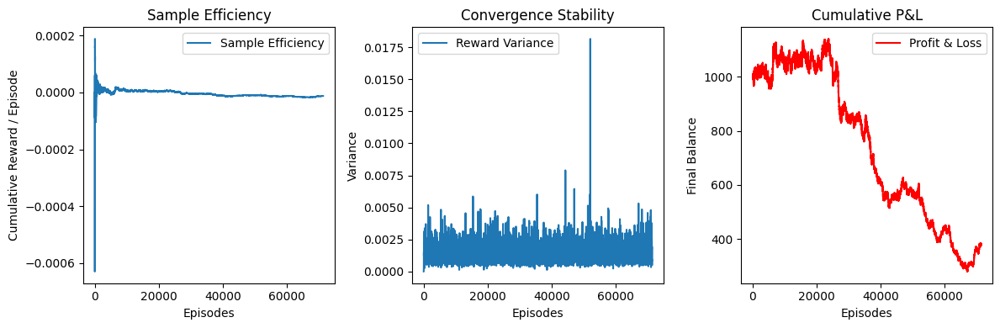

Performance Metrics:
Sample Efficiency: -1.2284386024687967e-05
Convergence Stability: 0.0016728388248804414
Cumulative P&L: 376.3641861861324


'\n# If I want to just run the perofmance \nevaluator.run_model(env = env_v1, model = model_v1)"\n'

In [9]:
# Usage example:
evaluator = PerformanceEvaluation(env_v1, model_v1)
evaluator.run_evaluation(show_plot=True, show_numerics=True, first_run = True)

"""
# If I want to just run the perofmance 
evaluator.run_model(env = env_v1, model = model_v1)"
"""